Importation des fichiers

In [1]:

import os

from random import shuffle
import numpy as np

from tqdm import tqdm 

Importation  librairies

In [2]:

import matplotlib.pyplot as plt

import cv2
import numpy as np

from PIL import Image

In [3]:
# Importation des librairies pour le CNN
import tensorflow as tf
from tensorflow import keras


from tensorflow.keras.models import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Dense

import timeit

gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    # Resteindre le tensflow pour n'allouer que 1 Go * 2 de mémoire sur le premier GPU
    try:
        tf.config.experimental.set_virtual_device_configuration(
            gpus[0],
            [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=1024 * 2)])
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Les modules virtuels  doivent être définis avant l'initialisation du premier GPU
        print(e)

device_name = tf.test.gpu_device_name()
if "GPU" not in device_name:
    print("GPU device not found")
print('Found GPU at: {}'.format(device_name))

1 Physical GPUs, 1 Logical GPUs
Found GPU at: /device:GPU:0


In [4]:
from tensorflow import keras
from numpy import expand_dims
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.preprocessing.image import ImageDataGenerator
from keras import backend as K

In [5]:
import imageio
import imgaug as ia
from imgaug import augmenters as iaa
# 

In [6]:
from sklearn.model_selection import train_test_split
from keras.utils.vis_utils import plot_model

lecture des données

In [7]:
ANNOTATION_DIR = 'annotations/Annotation' 
IMAGES_DIR = 'images/Images'

In [8]:
breed_list = os.listdir(IMAGES_DIR)
print("num. breeds total:", len(breed_list))

num. breeds total: 120


In [9]:
filtered_breeds = [breed.split('-',1)[1] for breed in breed_list] 
filtered_breeds[:120]

['Chihuahua',
 'Japanese_spaniel',
 'Maltese_dog',
 'Pekinese',
 'Shih-Tzu',
 'Blenheim_spaniel',
 'papillon',
 'toy_terrier',
 'Rhodesian_ridgeback',
 'Afghan_hound',
 'basset',
 'beagle',
 'bloodhound',
 'bluetick',
 'black-and-tan_coonhound',
 'Walker_hound',
 'English_foxhound',
 'redbone',
 'borzoi',
 'Irish_wolfhound',
 'Italian_greyhound',
 'whippet',
 'Ibizan_hound',
 'Norwegian_elkhound',
 'otterhound',
 'Saluki',
 'Scottish_deerhound',
 'Weimaraner',
 'Staffordshire_bullterrier',
 'American_Staffordshire_terrier',
 'Bedlington_terrier',
 'Border_terrier',
 'Kerry_blue_terrier',
 'Irish_terrier',
 'Norfolk_terrier',
 'Norwich_terrier',
 'Yorkshire_terrier',
 'wire-haired_fox_terrier',
 'Lakeland_terrier',
 'Sealyham_terrier',
 'Airedale',
 'cairn',
 'Australian_terrier',
 'Dandie_Dinmont',
 'Boston_bull',
 'miniature_schnauzer',
 'giant_schnauzer',
 'standard_schnauzer',
 'Scotch_terrier',
 'Tibetan_terrier',
 'silky_terrier',
 'soft-coated_wheaten_terrier',
 'West_Highland_wh

n02088238-basset


C:\Users\sofia\anaconda3\envs\GPUEnv\lib\site-packages\ipykernel_launcher.py:7: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  import sys


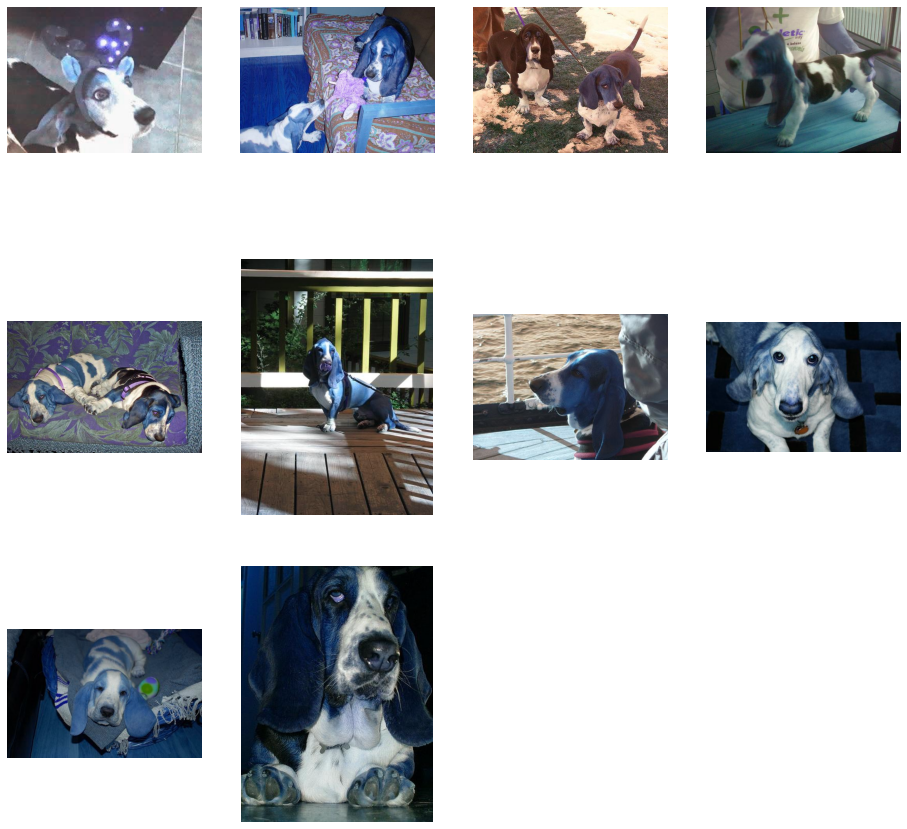

In [10]:
def show_dir_images(breed, n_to_show):
    plt.figure(figsize=(16,16))
    img_dir = "images/Images/{}/".format(breed)
    images = os.listdir(img_dir)[:n_to_show]
    for i in range(n_to_show):
        img = cv2.imread(img_dir + images[i])
        plt.subplot(n_to_show/4+1, 4, i+1)
        plt.imshow(img)
        plt.axis('off')



print(breed_list[10])
show_dir_images(breed_list[10], 10)

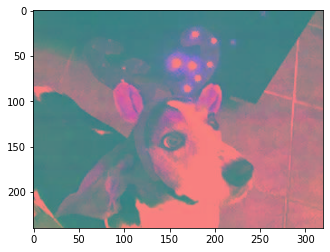

In [11]:
img_dir = "images/Images/{}/".format(breed_list[10])
images = os.listdir(img_dir)[:10]
images = os.listdir(img_dir)[:10]
img = cv2.imread(img_dir + images[0])

# Transformation de l'image par couleur
img_RGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
img_grayscale = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
img_to_yuv = cv2.cvtColor(img,cv2.COLOR_BGR2YUV)

plt.imshow(img_to_yuv)

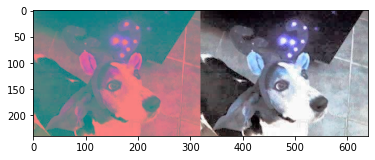

In [13]:
img_to_yuv[:,:,0] = cv2.equalizeHist(img_to_yuv[:,:,0])
equ = cv2.cvtColor(img_to_yuv, cv2.COLOR_YUV2BGR)
res = np.hstack((img_to_yuv,equ)) #image côte à côte
cv2.imwrite('res.png',res)
plt.imshow(res)

Augmented by rotation:


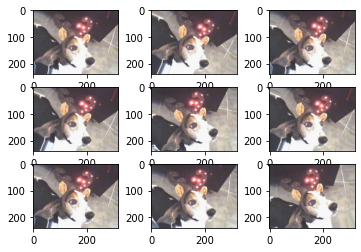

<Figure size 720x720 with 0 Axes>

In [15]:
print("Augmented by rotation:")

# conversion numpy array
data = img_to_array(img_RGB)

# étendre la dimension à un échantillon
samples = expand_dims(data, 0)
# ccréation d'une image data 
datagen = ImageDataGenerator(rotation_range=30)
# préparation de l'itération
it = datagen.flow(samples, batch_size=1)
# plot
for i in range(9):
    # subplot
    plt.subplot(330 + 1 + i)
    # batch des images
    batch = it.next()
    image = batch[0].astype('uint8')
    # données pixels brut
    plt.imshow(image)
# montrer l'image + sa taille
plt.figure(figsize = (10,10))
plt.show()

In [16]:
num_breeds = 30 # nombre de dossiers sélectionnés 
breeds = breed_list[:num_breeds]

def load_images_and_labels(breeds):
    img_lst=[]
    labels=[]
    for index, breed in enumerate(breeds):
        for image_name in os.listdir(IMAGES_DIR+"/"+breed):
            img = cv2.imread(IMAGES_DIR+"/"+breed+"/"+image_name)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            
            img_to_yuv[:,:,0] = cv2.equalizeHist(img_to_yuv[:,:,0]) # conversion en espace colorimétrique pour égalisation
            equ = cv2.cvtColor(img_to_yuv, cv2.COLOR_YUV2RGB) # égalisation des couleurs
            
            img_array = Image.fromarray(img, 'RGB')
            
            #redimension de l'image
            resized_img = img_array.resize((224, 224))
            
            img_lst.append(np.array(resized_img))
            
            labels.append(index)
    return img_lst, labels

images, labels = load_images_and_labels(breeds)
print("No. of images loaded = ",len(images),"\nNo. of labels loaded = ",len(labels))
print(type(images),type(labels))

No. of images loaded =  5448 
No. of labels loaded =  5448
<class 'list'> <class 'list'>


affichier les labels + images 

In [17]:
images = np.array(images)
labels = np.array(labels)

print("Images shape = ",images.shape,"\nLabels shape = ",labels.shape)
print(type(images),type(labels))

Images shape =  (5448, 224, 224, 3) 
Labels shape =  (5448,)
<class 'numpy.ndarray'> <class 'numpy.ndarray'>


Étape 1 : obtenir les nombres également espacés dans un espace précis

In [18]:
n = np.arange(images.shape[0])
print("10 'n' values before shuffling = ",n[:10])

#mélanger toutes les valeurs également espacées de la liste 'n'
np.random.seed(42)
np.random.shuffle(n)
print("10 'n' values after shuffling = ",n[:10])

10 'n' values before shuffling =  [0 1 2 3 4 5 6 7 8 9]
10 'n' values after shuffling =  [4525 5312 5097 3844 3032  812 2348 4750 1864 4376]


Étape 2 : mélanger les images et les données d'étiquettes correspondantes dans les deux listes

In [19]:
images = images[n]
labels = labels[n]

print("Images shape after shuffling = ",images.shape,"\nLabels shape after shuffling = ",labels.shape)
print('same shapes before and after shuffling')

Images shape after shuffling =  (5448, 224, 224, 3) 
Labels shape after shuffling =  (5448,)
same shapes before and after shuffling


In [20]:
images = images.astype(np.float32)
labels = labels.astype(np.int32)
images = images/255

In [21]:
x_train, x_test, y_train, y_test = train_test_split(images, labels, test_size = 0.2, random_state = 42)

x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.1, random_state=1)

print("x_train shape = ",x_train.shape)
print("y_train shape = ",y_train.shape)

print("\nx_val shape = ",x_val.shape)
print("y_val shape = ",y_val.shape)

print("\nx_test shape = ",x_test.shape)
print("y_test shape = ",y_test.shape)

x_train shape =  (3922, 224, 224, 3)
y_train shape =  (3922,)

x_val shape =  (436, 224, 224, 3)
y_val shape =  (436,)

x_test shape =  (1090, 224, 224, 3)
y_test shape =  (1090,)


In [22]:
datagen = ImageDataGenerator(
        rotation_range=30,
        horizontal_flip=True,
        fill_mode='nearest')

# fixer les paramètres data
datagen.fit(x_train, augment=True)

Modèle séquentiel :

In [23]:
model = Sequential()
# première couche
model.add(Conv2D(16, (3, 3), padding='same', use_bias=False, input_shape=(224, 224, 3)))
model.add(BatchNormalization(axis=3, scale=False))
model.add(Activation("relu"))
model.add(MaxPooling2D(pool_size=(4, 4), strides=(4, 4), padding='same'))
model.add(Dropout(0.2))
# seconde couche
model.add(Conv2D(32, (3, 3), padding='same', use_bias=False))
model.add(BatchNormalization(axis=3, scale=False))
model.add(Activation("relu"))
model.add(MaxPooling2D(pool_size=(4, 4), strides=(4, 4), padding='same'))
model.add(Dropout(0.2))
# troisième couche
model.add(Conv2D(64, (3, 3), padding='same', use_bias=False))
model.add(BatchNormalization(axis=3, scale=False))
model.add(Activation("relu"))
model.add(MaxPooling2D(pool_size=(4, 4), strides=(4, 4), padding='same'))
model.add(Dropout(0.2))
# quatrième couche
model.add(Conv2D(128, (3, 3), padding='same', use_bias=False))
model.add(BatchNormalization(axis=3, scale=False))
model.add(Activation("relu"))
model.add(Flatten())
model.add(Dropout(0.2))
# couches connectées
model.add(Dense(512, activation='relu'))
model.add(Dense(120, activation='softmax'))
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 224, 224, 16)      432       
_________________________________________________________________
batch_normalization (BatchNo (None, 224, 224, 16)      48        
_________________________________________________________________
activation (Activation)      (None, 224, 224, 16)      0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 56, 56, 16)        0         
_________________________________________________________________
dropout (Dropout)            (None, 56, 56, 16)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 56, 56, 32)        4608      
_________________________________________________________________
batch_normalization_1 (Batch (None, 56, 56, 32)        9

compilation modèle :

In [24]:
model.compile(optimizer="adam", loss="sparse_categorical_crossentropy", metrics=["accuracy"])
K.set_value(model.optimizer.learning_rate, 0.0015)

In [25]:
%%time
history =model.fit(x_train, y_train, epochs=50)

Epoch 1/50
123/123 [==============================] - 7s 24ms/step - loss: 3.8403 - accuracy: 0.0496
Epoch 2/50
123/123 [==============================] - 3s 23ms/step - loss: 3.1300 - accuracy: 0.1196
Epoch 3/50
123/123 [==============================] - 3s 22ms/step - loss: 2.9421 - accuracy: 0.1709
Epoch 4/50
123/123 [==============================] - 3s 22ms/step - loss: 2.7665 - accuracy: 0.2045
Epoch 5/50
123/123 [==============================] - 3s 23ms/step - loss: 2.6637 - accuracy: 0.2333
Epoch 6/50
123/123 [==============================] - 3s 23ms/step - loss: 2.5150 - accuracy: 0.2733
Epoch 7/50
123/123 [==============================] - 3s 22ms/step - loss: 2.4250 - accuracy: 0.2935
Epoch 8/50
123/123 [==============================] - 3s 23ms/step - loss: 2.3622 - accuracy: 0.2980
Epoch 9/50
123/123 [==============================] - 3s 23ms/step - loss: 2.2062 - accuracy: 0.3435
Epoch 10/50
123/123 [==============================] - 3s 23ms/step - loss: 2.1434 - accura

In [26]:
loss, accuracy = model.evaluate(x_test, y_test)

print(loss,accuracy)

35/35 [==============================] - 1s 14ms/step - loss: 4.2089 - accuracy: 0.2376
4.208930015563965 0.2376146763563156


In [27]:
pred = model.predict(x_test)

pred.shape

(1090, 120)

Lecture des images

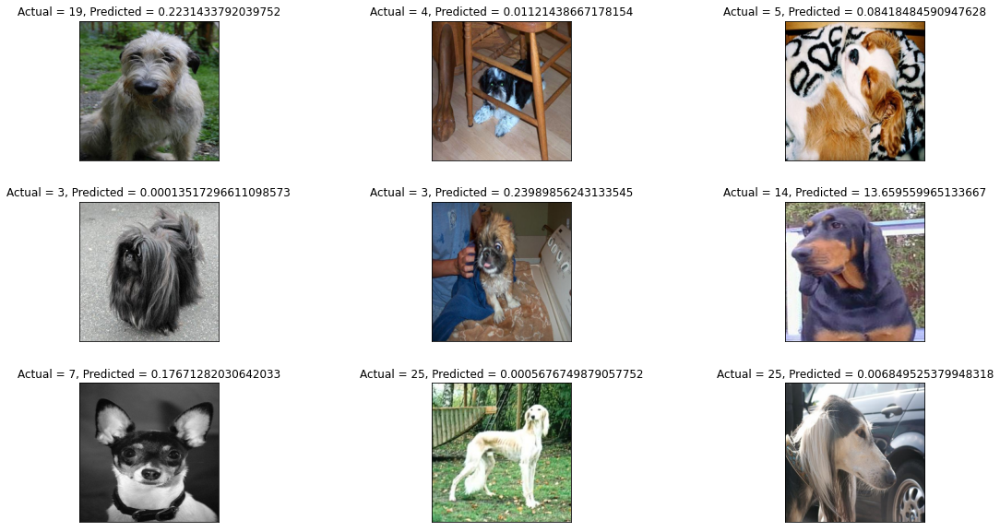

In [28]:
plt.figure(1 , figsize = (19 , 10))
n = 0 

for i in range(9):
    n += 1 
    r = np.random.randint( 0, x_test.shape[0], 1)
    
    plt.subplot(3, 3, n)
    plt.subplots_adjust(hspace = 0.3, wspace = 0.3)
    
    plt.imshow(x_test[r[0]])
    plt.title('Actual = {}, Predicted = {}'.format(y_test[r[0]] , y_test[r[0]]*pred[r[0]][y_test[r[0]]]) )
    plt.xticks([]) , plt.yticks([])

plt.show()

In [29]:
from keras.applications.vgg16 import VGG16
model2 = VGG16(input_shape= (224, 224, 3))

custom_transfert_learning = Sequential()
for layer in model2.layers[:-1]:
    custom_transfert_learning.add(layer)
custom_transfert_learning.summary()

for layer in custom_transfert_learning.layers:
    layer.trainable = False

custom_transfert_learning.add(Dense(units=120, activation='softmax'))

custom_transfert_learning.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
_________________________________________________________________
block3_conv1 (Conv2D)        (None, 56, 56, 256)      

In [30]:
model2.compile(optimizer="adam", loss="sparse_categorical_crossentropy", metrics=["accuracy"])
K.set_value(model2.optimizer.learning_rate, 0.0015)

In [31]:
%%time
history2 = model2.fit(x_train, y_train, validation_data=(x_val, y_val), epochs=50)

Epoch 1/50
123/123 [==============================] - 15s 102ms/step - loss: 4.2437 - accuracy: 0.0910 - val_loss: 3.0274 - val_accuracy: 0.1560
Epoch 2/50
123/123 [==============================] - 10s 77ms/step - loss: 2.7132 - accuracy: 0.2505 - val_loss: 2.7026 - val_accuracy: 0.2454
Epoch 3/50
123/123 [==============================] - 10s 79ms/step - loss: 2.6066 - accuracy: 0.2788 - val_loss: 2.7170 - val_accuracy: 0.2523
Epoch 4/50
123/123 [==============================] - 10s 77ms/step - loss: 2.3165 - accuracy: 0.3315 - val_loss: 2.8746 - val_accuracy: 0.2179
Epoch 5/50
123/123 [==============================] - 10s 78ms/step - loss: 2.2538 - accuracy: 0.3581 - val_loss: 2.5742 - val_accuracy: 0.2982
Epoch 6/50
123/123 [==============================] - 10s 78ms/step - loss: 2.1517 - accuracy: 0.3823 - val_loss: 2.6179 - val_accuracy: 0.2936
Epoch 7/50
123/123 [==============================] - 10s 78ms/step - loss: 1.9879 - accuracy: 0.4169 - val_loss: 2.8513 - val_accuracy

In [32]:
test_loss, test_accuracy = model2.evaluate(x_test, y_test)

print(test_loss,test_accuracy)

35/35 [==============================] - 3s 78ms/step - loss: 2.2363 - accuracy: 0.4037
2.236293077468872 0.40366971492767334


In [33]:
pred2 = model2.predict(x_test)

pred2.shape

(1090, 1000)

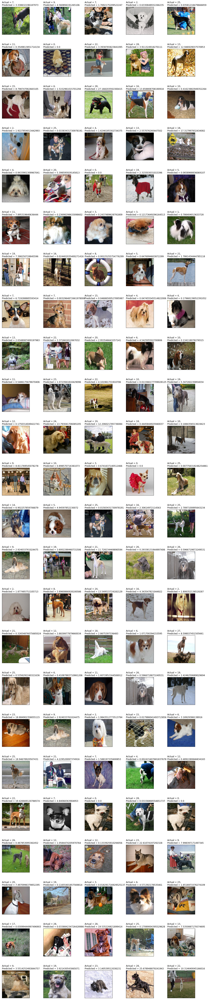

In [34]:
plt.figure(1 , figsize = (19 , 100))
n = 0 

for i in range(120):
    n += 1 
    r = np.random.randint( 0, x_test.shape[0], 1)
    
    plt.subplot(24, 5, n)
    plt.subplots_adjust(hspace = 0.5, wspace = 0.5)
    
    plt.imshow(x_test[r[0]])
    plt.title('Actual = {},\nPredicted = {}'.format(y_test[r[0]] , y_test[r[0]]*pred2[r[0]][y_test[r[0]]]),loc='left' )
    plt.xticks([]) , plt.yticks([])

plt.show()